In [37]:
"""
Code to generate synthetic data : cone, sphere, cubes with varying size, color gradient 
"""
import math
import torch 
import random
import torch.nn as nn
import numpy as np

def lerp(a, b, t):
    return a*(1 - t) + b*t

def rotation_matrix(axis, theta, in_degrees=True):
    """
    Return the rotation matrix associated with counterclockwise rotation about
    the given axis by theta radians.
    """
    if in_degrees:
        theta = math.radians(theta)
    axis = np.asarray(axis)
    axis = axis / math.sqrt(np.dot(axis, axis))
    a = math.cos(theta / 2.0)
    b, c, d = -axis * math.sin(theta / 2.0)
    aa, bb, cc, dd = a * a, b * b, c * c, d * d
    bc, ad, ac, ab, bd, cd = b * c, a * d, a * c, a * b, b * d, c * d
    return np.array([[aa + bb - cc - dd, 2 * (bc + ad), 2 * (bd - ac)],
                     [2 * (bc - ad), aa + cc - bb - dd, 2 * (cd + ab)],
                     [2 * (bd + ac), 2 * (cd - ab), aa + dd - bb - cc]])


def get_3d_locations(d,h,w,device_):
    locations_x = torch.linspace(0, w-1, w).view(1, 1, 1, w).expand(1, d, h, w)
    locations_y = torch.linspace(0, h-1, h).view(1, 1, h, 1).expand(1, d, h, w)
    locations_z = torch.linspace(0, d-1,d).view(1, d, 1, 1).expand(1, d, h, w)
    normalised_locs_x = (2.0*locations_x - (w-1))/(w-1)
    normalised_locs_y = (2.0*locations_y - (h-1))/(h-1)
    normalised_locs_z = (2.0*locations_z - (d-1))/(d-1)
    # stack locations
    locations_3d = torch.stack([normalised_locs_x, normalised_locs_y, normalised_locs_z], dim=4).view(-1, 3, 1).to(device_)
    return locations_3d

def rotate3d_tensor(input_tensor, rotation_matrix,mode='nearest',padding_mode="zeros"):
    """
    perform a 3d rotation to a pytorch  tensor of shape N C D H W according to a rotation matrix 
    """

    device_ = input_tensor.device
    bs,c, d, h, w  = input_tensor.shape
    # input_tensor = input_tensor.unsqueeze(0)
    # get x,y,z indices of target 3d data
    locations_3d = get_3d_locations(d, h, w, device_)
    # rotate target positions to the source coordinate

    rotated_3d_positions = torch.bmm(rotation_matrix.view(1, 3, 3).expand(d*h*w, 3, 3), locations_3d).view(1, d,h,w,3)

    rot_locs = torch.split(rotated_3d_positions, split_size_or_sections=1, dim=4)

    # change the range of x,y,z locations to [-1,1]

    grid = torch.stack([rot_locs[0], rot_locs[1], rot_locs[2]], dim=4).view(1, d, h, w, 3)
    # here we use the destination voxel-positions and sample the input 3d data trilinearly
    rotated_signal = nn.functional.grid_sample(input=input_tensor, grid=grid.repeat(bs,1,1,1,1), mode=mode,  align_corners=True,padding_mode=padding_mode)
    return rotated_signal#.squeeze(0)


def generate_3D_shape(shape: str, outer_extent: int, inner_extent: int, color1=(0.0, 5.0, 0.0), color2=None, random_rotation=False):
    # Use CUDA if available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Initialize the tensor on the GPU
    tensor = torch.zeros((outer_extent, outer_extent, outer_extent, 3), device=device)

    center = outer_extent // 2

    # Color handling
    if color2 is None:
        color2 = color1  # If only one color is provided, there's no gradient

    def gradient_color(height, max_height):
        """Calculate gradient color based on height."""
        ratio = float(height) / max_height
        return [lerp(ratio, color1[i], color2[i]) for i in range(3)]  # Changed to create a list


    # Depending on the shape, we fill the tensor differently
    if shape == 'sphere':
        radius = min(inner_extent // 2, center)  # to keep the sphere inside the tensor
        for x in range(outer_extent):
            for y in range(outer_extent):
                for z in range(outer_extent):
                    # Simple equation of a sphere
                    distance_squared = (x - center) ** 2 + (y - center) ** 2 + (z - center) ** 2
                    if distance_squared < radius ** 2:
                        distance = math.sqrt(distance_squared)  # Calculate the actual distance
                        ratio = distance / radius  # Normalize distance to get the ratio for lerp

                        # Now we use the ratio in the lerp function to get a color value
                        gradient = [lerp(ratio, color1[i], color2[i]) for i in range(3)]
                        tensor[x, y, z] = torch.tensor(gradient, dtype=torch.float)  # Assign gradient color


    elif shape == 'cone':
        height = inner_extent
        radius = inner_extent // 2
        for y in range(height):  # y is height here
            current_radius = int((height - y) * (float(radius) / height))  # Radius decreases as we move up
            for x in range(center - current_radius, center + current_radius + 1):
                for z in range(center - current_radius, center + current_radius + 1):
                    if (x - center) ** 2 + (z - center) ** 2 < current_radius ** 2:
                        # Within the circular cross-section
                        gradient = gradient_color(y, height)  # color based on height
                        tensor[x, y, z] = torch.tensor(gradient, dtype=torch.float)  # Specify the data type


    elif shape == 'cube':
        side_length = inner_extent
        start = (outer_extent - side_length) // 2
        end = start + side_length
        for x in range(start, end):
            for y in range(start, end):
                for z in range(start, end):
                    ratio = (x + y + z) / (3 * side_length)  # a simple way to create a gradient effect
                    gradient = (lerp(ratio, color1[i], color2[i]) for i in range(3))
                    tensor[x, y, z] = torch.tensor(gradient, dtype=torch.float)

    # After tensor is fully formed, before returning, check if random rotation is needed
    if random_rotation:
        # Generate a random rotation
        axis = np.random.rand(3) - 0.5  # random vector in [-0.5, 0.5]
        theta = random.random() * 2 * np.pi  # random angle
        rot_mat = rotation_matrix(axis, theta, in_degrees=False)

        # Convert numpy matrix to torch tensor
        rot_mat_torch = torch.from_numpy(rot_mat).float().to(device)

        # Reshape tensor to 5D (required for grid_sample)
        tensor_5d = tensor.unsqueeze(0).permute(0, 4, 1, 2, 3)  # New shape: [1, 3, D, H, W]

        # Apply rotation
        rotated_tensor = rotate3d_tensor(tensor_5d, rot_mat_torch)

        # Reshape tensor back to 4D
        tensor = rotated_tensor.permute(0, 2, 3, 4, 1).squeeze(0)  # Shape: [D, H, W, 3]

    # Clear CUDA cache
    if device.type == 'cuda':
        with torch.cuda.device(device):
            torch.cuda.empty_cache()

    # Return the tensor, making sure it's on the CPU
    return tensor.cpu()


# Example usage:
tensor = generate_3D_shape('cone', 80,50)#, color1 =(0, 1, 0))#color2 = (1, 0, 0))

# Generate a random rotation
axis = [0,1,0] #np.random.rand(3) - 0.5  # random vector in [-0.5, 0.5]
theta = random.random() * 2 * np.pi  # random angle
rot_mat = rotation_matrix(axis, theta, in_degrees=False)

# Convert numpy matrix to torch tensor
rot_mat_torch = torch.from_numpy(rot_mat).float()#.to(device)

# Reshape tensor to 5D (required for grid_sample)
tensor_5d = tensor.unsqueeze(0).permute(0, 4, 1, 2, 3)  # New shape: [1, 3, D, H, W]

# Apply rotation
rotated_tensor = rotate3d_tensor(tensor_5d, rot_mat_torch)

# Reshape tensor back to 4D
tensor = rotated_tensor.permute(0, 2, 3, 4, 1).squeeze(0)  # Shape: [D, H, W, 3]


In [38]:
import plotly.graph_objects as go
import numpy as np
import torch  # Make sure PyTorch is imported
import matplotlib.pyplot as plt 

def visualize_tensor(tensor: torch.Tensor):
    # Check if the tensor includes the color channel and adjust accordingly
    has_color = tensor.shape[-1] == 3

    # If we have color information, we want to separate the coordinates from the colors
    if has_color:
        # Get the indices where the tensor is non-zero (i.e., part of the shape)
        nonzero_indices = (tensor > 0).nonzero(as_tuple=False)
        
        # The indices refer to the positions; colors need to be gathered differently
        colors = tensor[nonzero_indices[:, 0], nonzero_indices[:, 1], nonzero_indices[:, 2]]  # Get colors for non-zero indices

        # Convert colors to a list of 'rgba' strings, incorporating the alpha channel
        color_strings = [
            'rgba({},{},{},{})'.format(c[0].item(), c[1].item(), c[2].item(), 1) 
            for c in colors
        ]
    else:
        # For tensors without color information, we simplify the logic
        nonzero_indices = tensor.nonzero(as_tuple=False)
        color_strings = 'rgba(255,255,255,1)'  # Default color (white)

    # Create a scatter plot of the points representing the shape
    trace = go.Scatter3d(
        x=nonzero_indices[:, 0].numpy(),  # x-coordinates of non-zero points
        y=nonzero_indices[:, 1].numpy(),  # y-coordinates
        z=nonzero_indices[:, 2].numpy(),  # z-coordinates
        mode='markers',
        marker=dict(
            size=4,
            color=color_strings,  # Color for each point
            opacity=0.8  # you may adjust the overall opacity
        )
    )

    layout = go.Layout(
        margin=dict(l=0, r=0, b=0, t=0),
        scene=dict(
            xaxis=dict(visible=False),
            yaxis=dict(visible=False),
            zaxis=dict(visible=False)
        )
    )

    fig = go.Figure(data=[trace], layout=layout)
    fig.show()
    fig.write_image("/work/emmanuelle/3D_reconstruction/synthetic.png")
    fig.write_html("/work/emmanuelle/3D_reconstruction/synthetic.html") 
    #plt.savefig("/work/emmanuelle/3D_reconstruction/synthetic.png")
    

visualize_tensor(tensor)


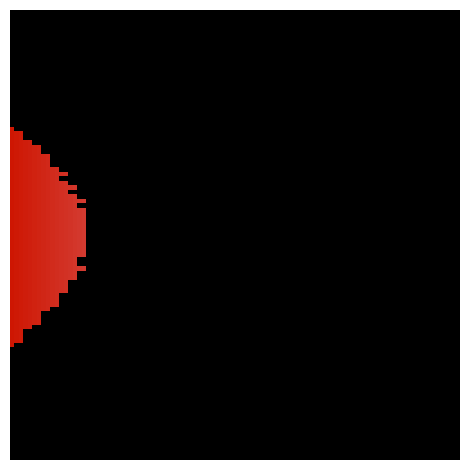

In [31]:
plt.imshow(((tensor[:,:,80,:] + tensor[:,:,80,:])/2))
plt.axis("off")
plt.tight_layout()
plt.savefig("/work/emmanuelle/3D_reconstruction/synth80.png",dpi=1000)

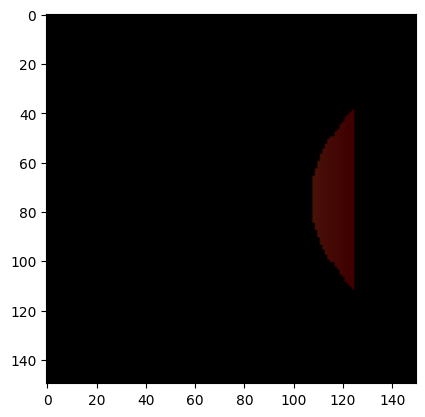

In [14]:

plt.imshow(((tensor[:,:,20,:] + tensor[:,:,140,:])/2))

In [6]:
print(axis)

[-0.19389235  0.17494114 -0.19343581]
